In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt


In [2]:
# Choose dataset folder (e.g., "eval15")
dataset_name = "eval15"
low_path = os.path.join("lol_dataset", dataset_name, "low")
high_path = os.path.join("lol_dataset", dataset_name, "high")

# Automatically detect matching filenames in both folders
low_filenames = set(os.listdir(low_path))
high_filenames = set(os.listdir(high_path))
test_filenames = sorted(list(low_filenames & high_filenames))  # Only use common files

print(f"Found {len(test_filenames)} matched image pairs.")


Found 15 matched image pairs.


In [3]:
import numpy as np
import cv2

def enhance_image_self_contained(img):
    # Convert image to float32 for more precise calculations
    img_float = img.astype(np.float32)

    # Increase brightness by multiplying with a factor (scale to range [0,255])
    brightness_factor = 2.3  
    img_bright = np.clip(img_float * brightness_factor, 0, 255)

    # Boost contrast using CLAHE (on the L channel)
    lab = cv2.cvtColor(img_bright.astype(np.uint8), cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))  
    l_clahe = clahe.apply(l)
    enhanced_lab = cv2.merge([l_clahe, a, b])
    enhanced_img = cv2.cvtColor(enhanced_lab, cv2.COLOR_LAB2BGR)

    # Step 4: Increase saturation by scaling the 'a' and 'b' channels (to add vibrancy)
    hsv = cv2.cvtColor(enhanced_img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    # Resize the channels to match the image size if needed
    h, s, v = map(lambda x: cv2.resize(x, (enhanced_img.shape[1], enhanced_img.shape[0])), [h, s, v])

    # Enhance saturation (increase color vibrancy)
    s = np.clip(s * 1.7, 0, 255)  # Saturation enhancement

    # Convert to np.uint8 before merging
    h = h.astype(np.uint8)
    s = s.astype(np.uint8)
    v = v.astype(np.uint8)

    # Merge the channels back into HSV space
    enhanced_hsv = cv2.merge([h, s, v])

    # Convert back to BGR
    final_img = cv2.cvtColor(enhanced_hsv, cv2.COLOR_HSV2BGR)

    return final_img


In [4]:
def show_comparison(low_img, enhanced_img, high_img, title=""):
    # Create a figure with three images
    plt.figure(figsize=(18, 6))
    
    # Plot low-light image
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(low_img, cv2.COLOR_BGR2RGB))
    plt.title("Low-light")
    plt.axis("off")
    
    # Plot enhanced image
    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(enhanced_img, cv2.COLOR_BGR2RGB))
    plt.title("Enhanced")
    plt.axis("off")
    
    # Plot high-quality image
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(high_img, cv2.COLOR_BGR2RGB))
    plt.title("High-quality")
    plt.axis("off")
    
    # Add a title to the entire figure
    if title:
        plt.suptitle(title)
    
    # Show the plot
    plt.show()


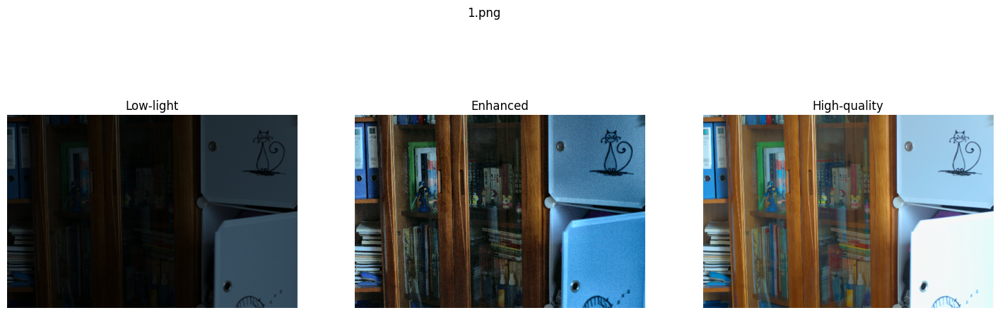

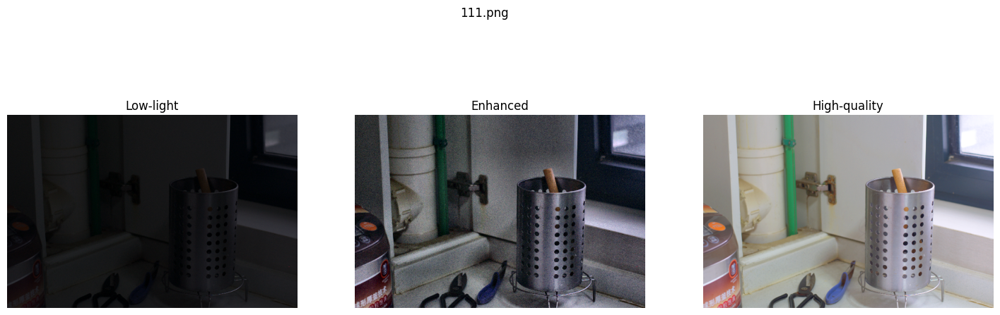

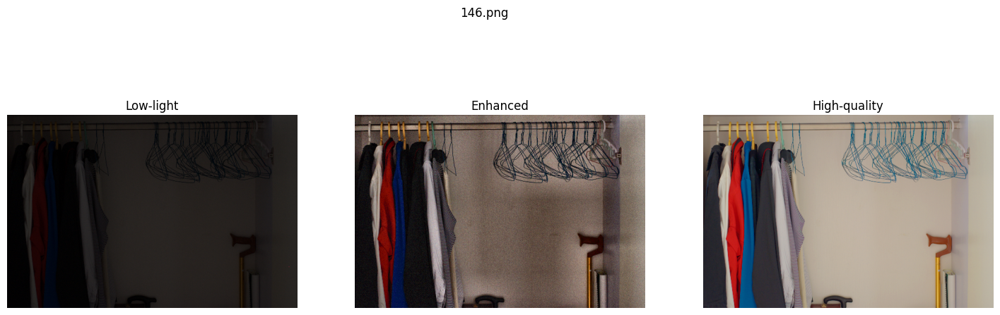

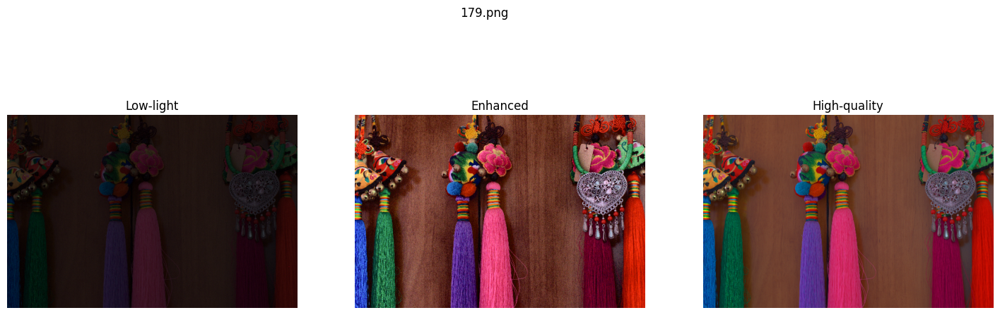

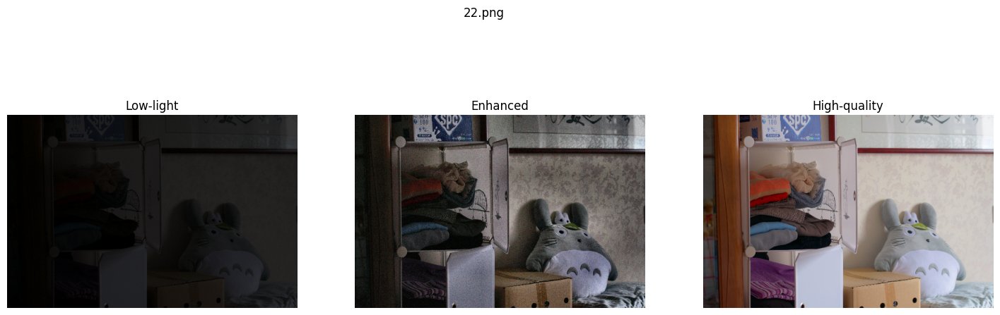

...

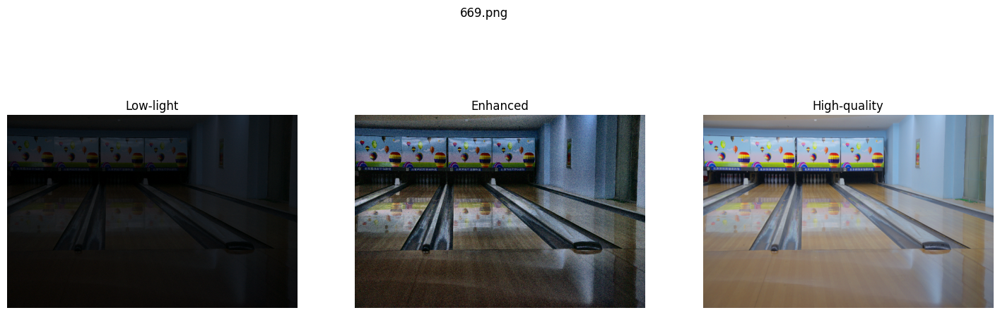

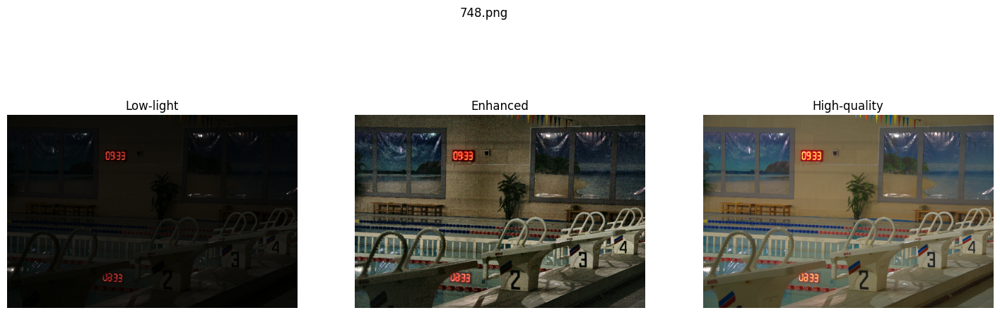

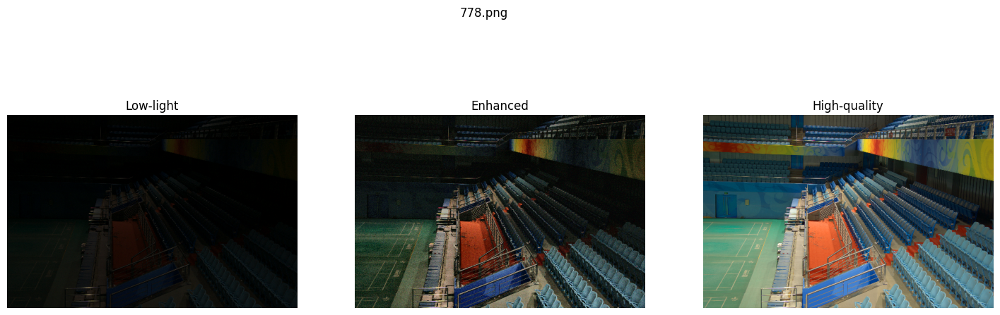

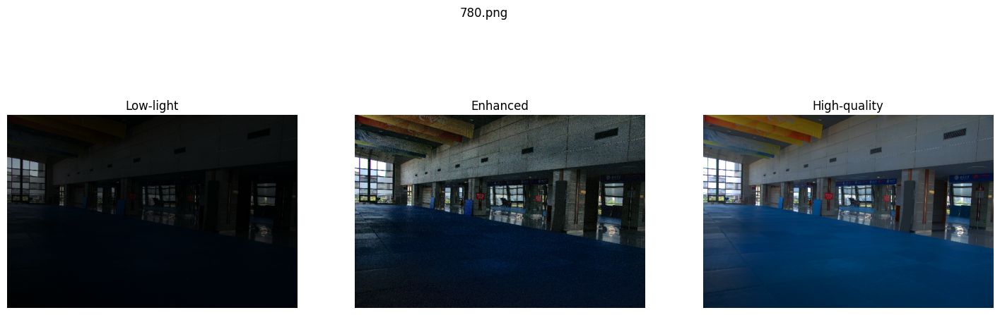

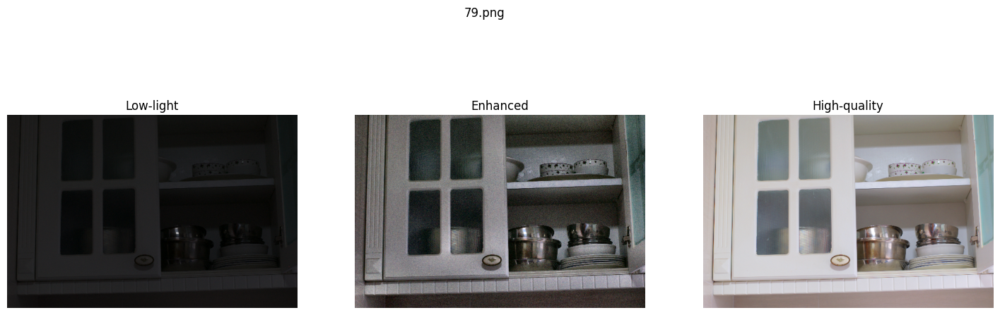

In [5]:
for filename in test_filenames:
    low_file_path = os.path.join(low_path, filename)
    high_file_path = os.path.join(high_path, filename)

    # Load the low-light image
    low_img = cv2.imread(low_file_path)
    
    # Load the high-quality image
    high_img = cv2.imread(high_file_path)
    
    # Enhance the low-light image
    enhanced_img = enhance_image_self_contained(low_img)
    
    # Display the comparison of low, enhanced, and high images
    show_comparison(low_img, enhanced_img, high_img, title=filename)
